### Library Requirements

    The propulse of this section is import  all requirements packages we need during our task

In [1]:
## import requirements librairies
import numpy as np
import pandas as pd
import dask.dataframe as dd
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_rows', 15)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

import geopandas as gpd
import folium
from folium import plugins
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

/home/linuce/.local/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/home/linuce/.local/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.2.1' currently installed).
  from pandas.core import (


No Bottleneck unit testing available.


/home/linuce/.local/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/home/linuce/.local/lib/python3.9/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


### Load our dataset

The aims of this section is to load our dataset we are already processing and cleaning in our precedent notebook. in this part we just load our dataset parser to column data and get the appropriate name of week for every record

In [2]:
data = dd.read_csv("./data_set.csv", parse_dates=["start_time"])

# get the name of day of  week for every record
data['day_of_week'] = data['start_time'].dt.day_name()
data = data.sort_values(['square_id', 'start_time'])
data = data.compute() ## tranform into pandas dataframe
data.head(100)

,square_id,start_time,internet_traffic_activity,day_of_week
0,1,2013-10-31 23:00:00,57.799009,Thursday
1,1,2013-11-01 00:00:00,44.046899,Friday
2,1,2013-11-01 01:00:00,41.207149,Friday
3,1,2013-11-01 02:00:00,33.022070,Friday
4,1,2013-11-01 03:00:00,31.376930,Friday
...,...,...,...,...
95,1,2013-11-04 22:00:00,67.122955,Monday
96,1,2013-11-04 23:00:00,56.481138,Monday
97,1,2013-11-05 00:00:00,49.848740,Tuesday
98,1,2013-11-05 01:00:00,46.394877,Tuesday


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14878360 entries, 0 to 1235806
Data columns (total 4 columns):
 #   Column                     Dtype         
---  ------                     -----         
 0   square_id                  int64         
 1   start_time                 datetime64[ns]
 2   internet_traffic_activity  float64       
 3   day_of_week                object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 567.6+ MB


## View area of interest in the Map

The propulse of this section is to show to all the eara of our study


In [4]:
path_city = './milano-grid.geojson'

gdf = gpd.read_file(path_city)

gdf.info() ##  get information abour our geaographique area

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   cellId    10000 non-null  int32   
 1   geometry  10000 non-null  geometry
dtypes: geometry(1), int32(1)
memory usage: 117.3 KB


In [5]:
map_milan = folium.Map(location=[45.4642, 9.1900], zoom_start=12)

for _, row in gdf.iterrows():
    cell_id = row['cellId']
    geometry = row['geometry']
    folium.GeoJson(geometry).add_to(map_milan)

In [6]:
## display our map in the notebook and 
## this map shwo us the area of intersest where the data have been collected
map_milan

### Part 1

This propulse of this part is to do  the exploration data analysis of our data in order to extract the meaning information from our data. This information can help us to choice the good model that can met all with our time series data

### Plot the PDF(Probability Density Function)

In this section we just plot the pdf our dataset in each city or area in milan over the two months. Before do that we need to calculate the total internet traffic activity in each area in th city milan

In [7]:
total_traffic_each_area = data[['square_id', 'internet_traffic_activity']].groupby('square_id').sum().reset_index()
total_traffic_each_area.head(10)

,square_id,internet_traffic_activity
0,1,92992.666580
1,2,93368.388389
2,3,93768.329391
3,4,91904.381588
4,5,83630.697355
5,6,93768.329391
6,7,93768.329391
7,8,93768.329391
8,9,93768.329391
9,10,56177.723211


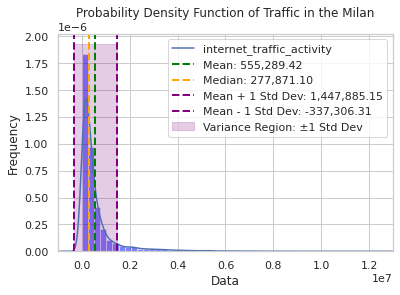

Mean Traffic: 555,289.42
Median Traffic: 277,871.10
Standard Deviation: 892,595.73
Variance: 796,727,141,100.52
Skewness: 4.26
Kurtosis: 25.50


In [43]:
# Remove inf and NaN from the 'internet_traffic_activity' column
from scipy.stats import skew, kurtosis
def iqr(a):
    """Calculate the IQR for an array of numbers."""
    q1 = a.quantile(0.25) 
    q3 = a.quantile(0.75) 
    return q3 - q1

def _freedman_diaconis_bins(a):
    """Calculate number of hist bins using Freedman-Diaconis rule."""
    # From https://stats.stackexchange.com/questions/798/
    if len(a) < 2:
        return 1
    h = 2 * iqr(a) / (len(a) ** (1 / 3))
    # fall back to sqrt(a) bins if iqr is 0
    if h == 0:
        return int(np.sqrt(a.size))
    else:
        return int(np.ceil((a.max() - a.min()) / h))
    
bins = min(_freedman_diaconis_bins(total_traffic_each_area["internet_traffic_activity"]), 50)


# Calculate statistical measures
mean_traffic = total_traffic_each_area["internet_traffic_activity"].mean()
median_traffic = total_traffic_each_area["internet_traffic_activity"].median()
std_traffic = total_traffic_each_area["internet_traffic_activity"].std()
variance_traffic = total_traffic_each_area["internet_traffic_activity"].var()
skewness_traffic = skew(total_traffic_each_area["internet_traffic_activity"])
kurtosis_traffic = kurtosis(total_traffic_each_area["internet_traffic_activity"])

plt.hist(total_traffic_each_area["internet_traffic_activity"], bins=bins, density=True, color='blue', alpha=0.5)
total_traffic_each_area['internet_traffic_activity'].plot(kind='density')

# Plot vertical lines for Mean, Median, and Standard Deviation
plt.axvline(mean_traffic, color='green', linestyle='dashed', linewidth=2, label=f'Mean: {mean_traffic:,.2f}')
plt.axvline(median_traffic, color='orange', linestyle='dashed', linewidth=2, label=f'Median: {median_traffic:,.2f}')
plt.axvline(mean_traffic + std_traffic, color='purple', linestyle='dashed', linewidth=2, label=f'Mean + 1 Std Dev: {mean_traffic + std_traffic:,.2f}')
plt.axvline(mean_traffic - std_traffic, color='purple', linestyle='dashed', linewidth=2, label=f'Mean - 1 Std Dev: {mean_traffic - std_traffic:,.2f}')

# Add shaded region to represent variance (Mean ± Std Dev)
plt.fill_betweenx(
    y=[0, plt.ylim()[1]], 
    x1=mean_traffic - std_traffic, 
    x2=mean_traffic + std_traffic, 
    color='purple', alpha=0.2, label=f'Variance Region: ±1 Std Dev')


# Set the x-axis limits
plt.xlim([-0.1*1e7, 1.3*1e7])
# Add labels and title to the plot
plt.xlabel('Data')
plt.ylabel('Frequency')
plt.title('Probability Density Function of Traffic in the Milan')
plt.legend()
plt.savefig('./figures/dist_data_city_milan.png')

plt.show()


# Optionally, print the statistics as well
print(f'Mean Traffic: {mean_traffic:,.2f}')
print(f'Median Traffic: {median_traffic:,.2f}')
print(f'Standard Deviation: {std_traffic:,.2f}')
print(f'Variance: {variance_traffic:,.2f}')
print(f'Skewness: {skewness_traffic:,.2f}')
print(f'Kurtosis: {kurtosis_traffic:,.2f}')



### Diplay the Time series of three area in Milan

In this section, we will display the eveoltuion of internet traffic activity in area:
 - the area with the highest total traffic during the two-month period,
 - the area with Square id 4159
 - the area with Square id 4556

In [9]:
### first we need to find the area with highest total internet trafic activity
### let's find the square_id for this area
square_id_with_max_traffic = int(total_traffic_each_area.iloc[total_traffic_each_area.idxmax()['internet_traffic_activity']].square_id)
print(square_id_with_max_traffic)
total_traffic_each_area.sort_values('internet_traffic_activity', ascending=False).head(5)

5161


,square_id,internet_traffic_activity
5160,5161,1.274006e+07
5058,5059,1.117085e+07
5258,5259,1.048578e+07
5060,5061,9.584334e+06
5257,5258,8.707440e+06


### Get the internet trafiic activity the three area we are mentioned above

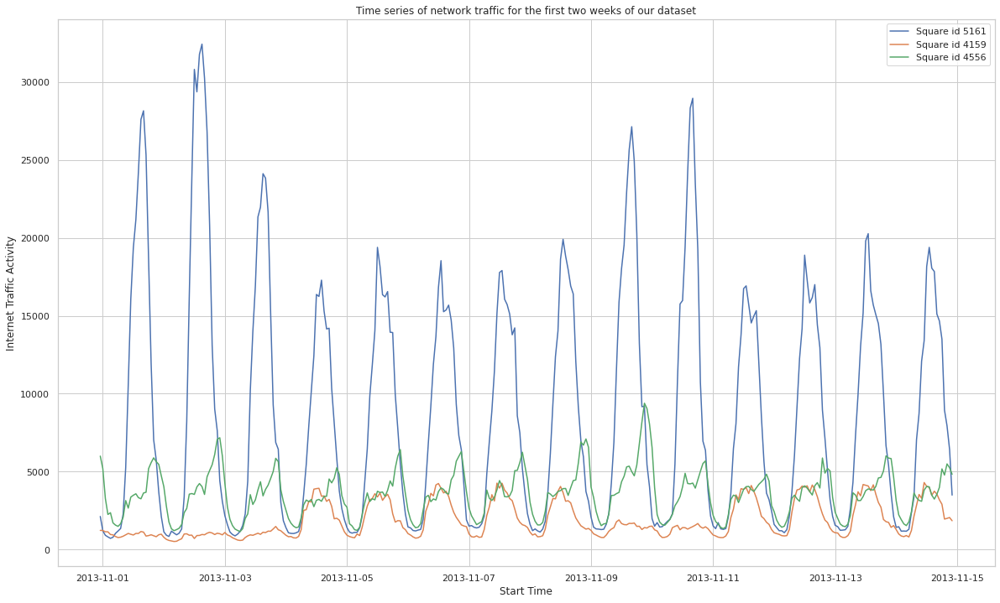

In [45]:
# Plot the internet traffic of first two weeks for selected area
two_weeks_data = data[data['start_time'] < data['start_time'].min() + pd.Timedelta(weeks=2)].sort_values('start_time')

## get the internet traffic activity for each area
square_id_5161 = two_weeks_data[two_weeks_data["square_id"]==5161]
square_id_4159 = two_weeks_data[two_weeks_data["square_id"]==4159]
square_id_4556 = two_weeks_data[two_weeks_data["square_id"]==4556]


plt.figure(figsize=(20, 12))
plt.plot(square_id_5161["start_time"].values.flatten(), square_id_5161["internet_traffic_activity"].values.flatten(), label=f'Square id {square_id_with_max_traffic}')
plt.plot(square_id_4159["start_time"].values.flatten(), square_id_4159["internet_traffic_activity"].values.flatten(), label=f'Square id 4159')
plt.plot(square_id_4556["start_time"].values.flatten(), square_id_4556["internet_traffic_activity"].values.flatten(), label=f'Square id 4556')
plt.xlabel('Start Time')
plt.ylabel('Internet Traffic Activity')
plt.title('Time series of network traffic for the first two weeks of our dataset')
plt.legend()
plt.savefig('./figures/time_series_three_area.png')

plt.show()

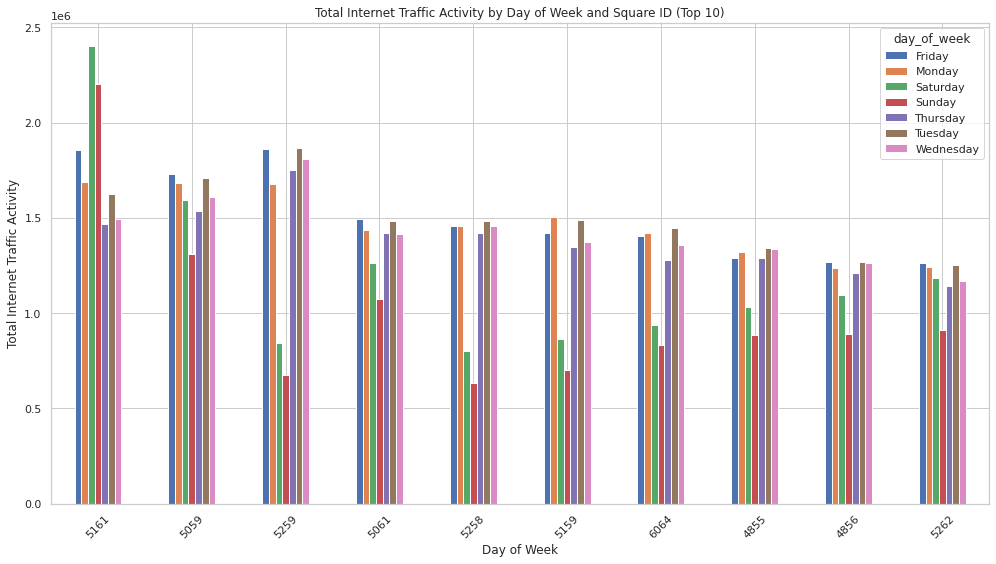

In [46]:

# Step 1: Calculate the total internet traffic activity for each square_id
total_traffic_per_square = data.groupby('square_id')['internet_traffic_activity'].sum()

# Step 2: Get the top 10 square_id with the highest internet traffic activity
top_10_squares = total_traffic_per_square.nlargest(10).index

# Step 3: Filter the original data to include only the top 10 square_id
filtered_data = data[data['square_id'].isin(top_10_squares)].copy()  # Use .copy() to avoid warning

# Step 4: Ensure 'day_of_week' is ordered correctly using .loc[] to avoid SettingWithCopyWarning
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
filtered_data.loc[:, 'day_of_week'] = pd.Categorical(filtered_data['day_of_week'], categories=day_order, ordered=True)

# Step 5: Group by 'square_id' and 'day_of_week' and calculate the sum of internet_traffic_activity
# Use observed=False explicitly to avoid FutureWarning
grouped = filtered_data.groupby(['square_id', 'day_of_week'], observed=False)['internet_traffic_activity'].sum().unstack()

# Step 6: Sort the grouped data by square_id (by sum of internet traffic activity)
grouped = grouped.loc[total_traffic_per_square.nlargest(10).index]

# Step 7: Plot the data
fig, ax = plt.subplots(figsize=(14, 8))

# Plot for each square_id (since grouped is a DataFrame, we can plot each column for each square_id)
grouped.plot(kind='bar', ax=ax, stacked=False,)

# Step 8: Set labels and title
ax.set_xlabel('Day of Week')
ax.set_ylabel('Total Internet Traffic Activity')
ax.set_title('Total Internet Traffic Activity by Day of Week and Square ID (Top 10)')

# Step 9: Adjust the x-tick labels to show day_of_week properly
ax.set_xticklabels(grouped.index, rotation=45)

# Step 10: Show the plot
plt.tight_layout()
plt.savefig("./figures/10_top_area_by_day_week.png")
plt.show()

<ipython-input-47-01e6dc71945f>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='day_of_week', y='internet_traffic_activity', data=grouped, palette='viridis')


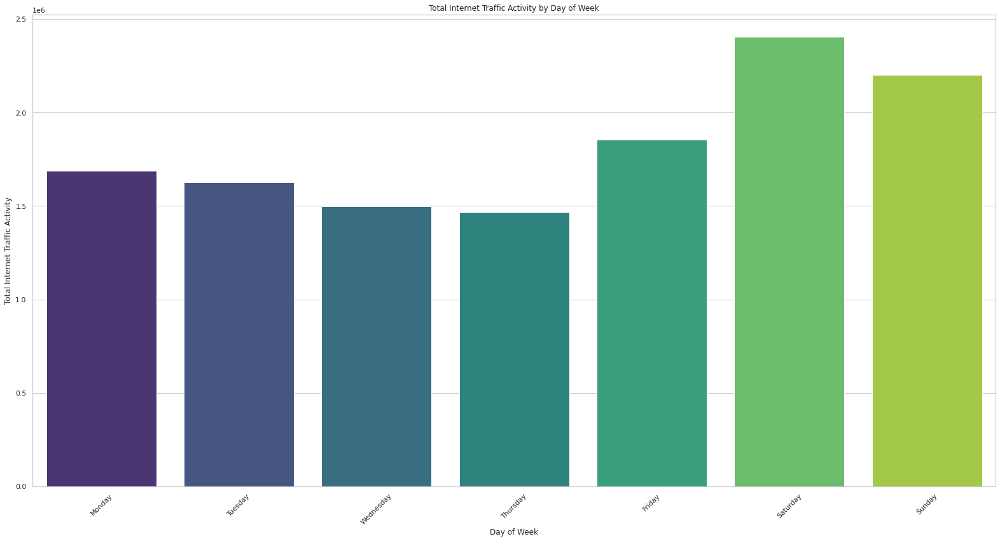

In [47]:

# Group by 'day_of_week' and calculate the sum of 'internet_traffic_activity'
grouped = data[data["square_id"]==5161].groupby(['day_of_week'], observed=False)['internet_traffic_activity'].sum().reset_index()

# Sort the days of the week in the correct order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
grouped['day_of_week'] = pd.Categorical(grouped['day_of_week'], categories=day_order, ordered=True)

# Create the barplot using Seaborn
plt.figure(figsize=(22, 12))
sns.set(style="whitegrid")  # Set the background style

# Create a barplot for internet traffic activity by day_of_week
sns.barplot(x='day_of_week', y='internet_traffic_activity', data=grouped, palette='viridis')

# Set labels and title
plt.xlabel('Day of Week')
plt.ylabel('Total Internet Traffic Activity')
plt.title('Total Internet Traffic Activity by Day of Week')

# Rotate the x-tick labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.savefig("./figures/5161_by_day_week.png")
plt.show()

<ipython-input-48-7329e7310cf0>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='day_of_week', y='internet_traffic_activity', data=data[data["square_id"]==5161], order=days_of_week, palette='Set2')


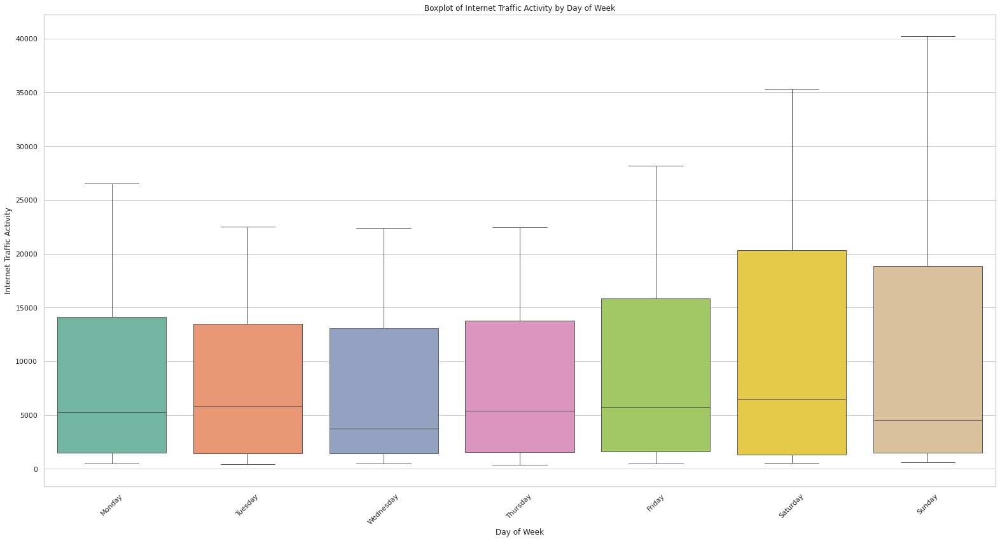

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data (use your actual data)
# Assuming `data` is your dataframe
# traffic_by_day = [data[data['day_of_week'] == day]['internet_traffic_activity'].values for day in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']]

# Set the order of the days of the week (optional, to ensure proper sorting)
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Create the boxplot using Seaborn
plt.figure(figsize=(22, 12))
sns.set(style="whitegrid")  # Set background style for grid lines

# Create a boxplot for internet traffic by day_of_week using Seaborn
sns.boxplot(x='day_of_week', y='internet_traffic_activity', data=data[data["square_id"]==5161], order=days_of_week, palette='Set2')

# Set labels and title
plt.xlabel('Day of Week')
plt.ylabel('Internet Traffic Activity')
plt.title('Boxplot of Internet Traffic Activity by Day of Week')

# Rotate x-tick labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.savefig("./figures/box_plot_5161.png")
plt.show()

<ipython-input-49-3c8c04528a74>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='internet_traffic_activity', data=hourly_sum, palette='viridis')


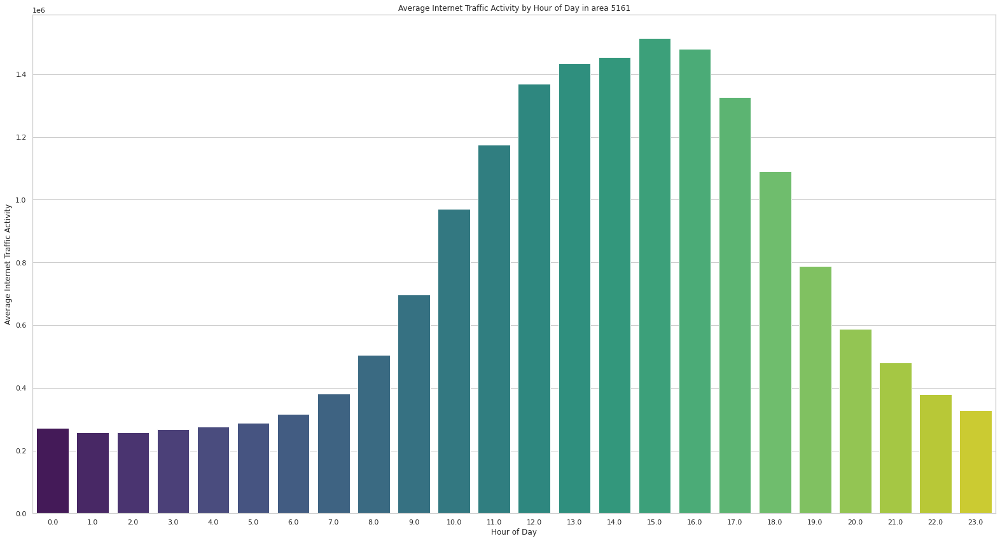

<ipython-input-49-3c8c04528a74>:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='internet_traffic_activity', data=hourly_sum, palette='viridis')


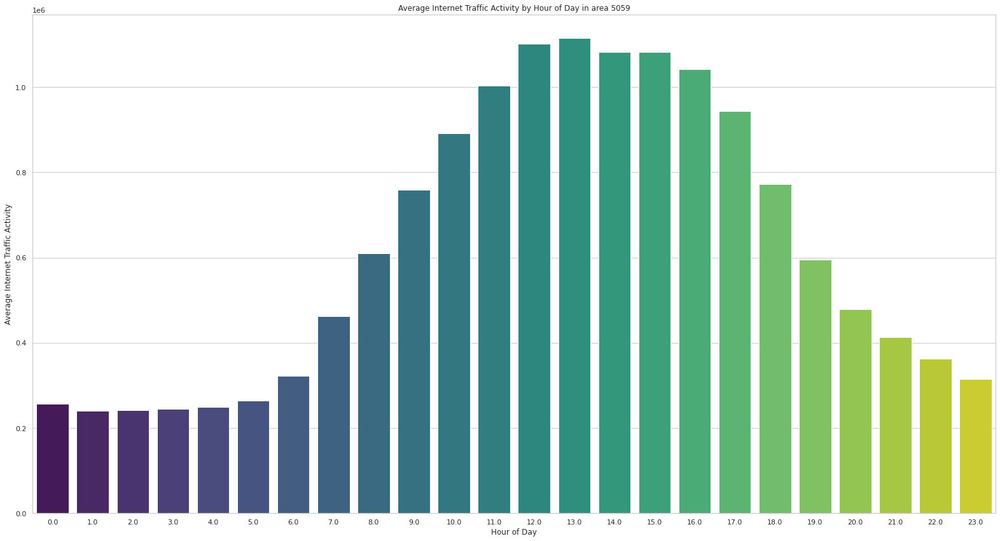

ValueError: Could not interpret value `` for `hue`. An entry with this name does not appear in `data`.

<Figure size 1584x864 with 0 Axes>

In [49]:
# Group the data by 'hour' and calculate the mean of 'internet_traffic_activity' for each hour

# Extract the hour from 'start_time' and create a new column 'hour'
data['hour'] = data[data["square_id"]==5161]['start_time'].dt.hour

hourly_sum = data.groupby('hour')['internet_traffic_activity'].sum().reset_index()

# Create the barplot
plt.figure(figsize=(22, 12))
sns.barplot(x='hour', y='internet_traffic_activity', data=hourly_sum, palette='viridis')

# Set labels and title
plt.xlabel('Hour of Day')
plt.ylabel('Average Internet Traffic Activity')
plt.title('Average Internet Traffic Activity by Hour of Day in area 5161')

# Show the plot
plt.tight_layout()
plt.savefig("./figures/hourly_5161.png")
plt.show()


# Group the data by 'hour' and calculate the mean of 'internet_traffic_activity' for each hour

# Extract the hour from 'start_time' and create a new column 'hour'
data['hour'] = data[data["square_id"]==5059]['start_time'].dt.hour

hourly_sum = data.groupby('hour')['internet_traffic_activity'].sum().reset_index()

# Create the barplot
plt.figure(figsize=(22, 12))
sns.barplot(x='hour', y='internet_traffic_activity', data=hourly_sum, palette='viridis')

# Set labels and title
plt.xlabel('Hour of Day')
plt.ylabel('Average Internet Traffic Activity')
plt.title('Average Internet Traffic Activity by Hour of Day in area 5059')

# Show the plot
plt.tight_layout()
plt.savefig("./figures/hourly_5059.png")
plt.show()

# Group the data by 'hour' and calculate the mean of 'internet_traffic_activity' for each hour

# Extract the hour from 'start_time' and create a new column 'hour'
data['hour'] = data[data["square_id"]==5259]['start_time'].dt.hour

hourly_sum = data.groupby('hour')['internet_traffic_activity'].sum().reset_index()

# Create the barplot
plt.figure(figsize=(22, 12))
sns.barplot(x='hour', y='internet_traffic_activity', data=hourly_sum, palette='viridis', hue="")

# Set labels and title
plt.xlabel('Hour of Day')
plt.ylabel('Average Internet Traffic Activity')
plt.title('Average Internet Traffic Activity by Hour of Day in area 5259')

# Show the plot
plt.tight_layout()
plt.savefig("./figures/hourly_5259.png")
plt.show()

In [51]:
# Identify the top 10 square_ids with the most internet traffic
top_squares = data.groupby('square_id')['internet_traffic_activity'].sum().nlargest(10).index

# Filter the data to only include these top 10 square_ids
top_squares_data = data[data['square_id'].isin(top_squares)]

cell_ids_to_display = top_squares

filtered_gdf = gdf[gdf['cellId'].isin(top_squares)]
map_milan = folium.Map(location=[45.4642, 9.1900], zoom_start=12)
for _, row in filtered_gdf.iterrows():
    cell_id = row['cellId']
    geometry = row['geometry']
    cell_polygon = folium.GeoJson(geometry, style_function=lambda x: {'fillColor': 'transparent', 'color': 'black'})
    cell_popup = folium.Popup(f"Cell ID: {cell_id}", show=True)
    folium.CircleMarker(location=[geometry.centroid.y, geometry.centroid.x], radius=5, color='red', fill=True).add_to(map_milan)
    cell_popup.add_to(cell_polygon)
    cell_polygon.add_to(map_milan)

map_milan

<ipython-input-55-ad4a43dd4e46>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_squares_data['hour'] = top_squares_data['start_time'].dt.hour
<ipython-input-55-ad4a43dd4e46>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='internet_traffic_activity', data=hourly_sum, palette='viridis')


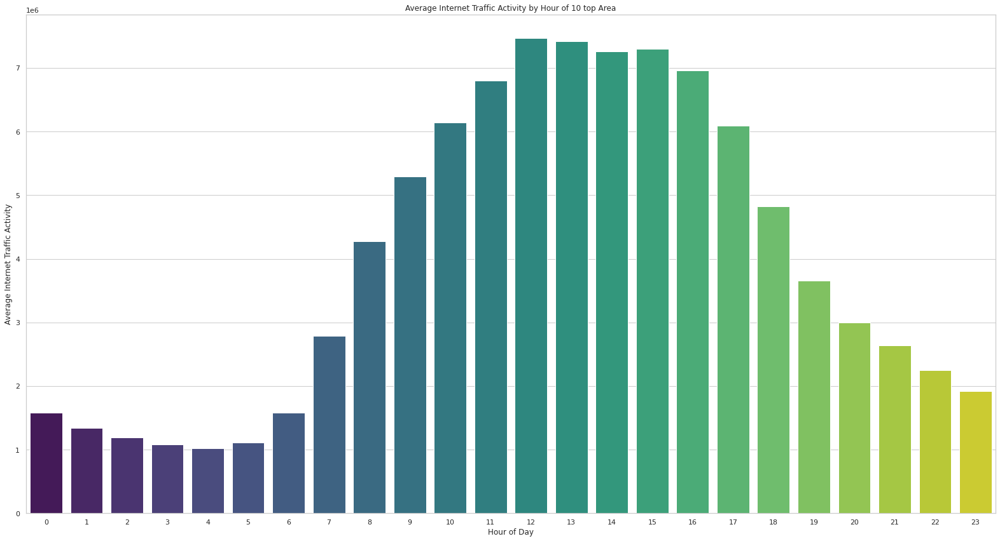

In [55]:
top_squares_data['hour'] = top_squares_data['start_time'].dt.hour

hourly_sum = top_squares_data.groupby('hour')['internet_traffic_activity'].sum().reset_index()

# Create the barplot
plt.figure(figsize=(22, 12))
sns.barplot(x='hour', y='internet_traffic_activity', data=hourly_sum, palette='viridis')

# Set labels and title
plt.xlabel('Hour of Day')
plt.ylabel('Average Internet Traffic Activity')
plt.title('Average Internet Traffic Activity by Hour of 10 top Area')

# Show the plot
plt.tight_layout()
plt.savefig("./figures/hourly_10_top_area.png")
plt.show()

## part 2: Train Time Series model to predict the future Internet traffic activity

In this section we just train a model to predict internet traffic activity in three area, before we need some investigation to choice a model that is adapt to our time series. After choice a model, the second part is to find the good parameter of our model(with Hyperparameter tuning or statistical method or graical method like Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF)) using metric like AIC etc...

### ARIMA Model

Most of the popular model in time series forecast is the arima model, before train something let's verify if all the assumption about arima model met, most of the statistical time series model work with assumption that time series is stationary: such as mean, variance remain constant over time. Intuitively, we can sat that if a TS has a particular behaviour over time, there are a very high probability that it will follow the same in the future. Also, the theories related to stationary series are more mature and easier to implement as compared to non-stationary series.

Stationarity is defined using very strict criterion. However, for practical purposes we can assume the series to be stationary if it has constant statistical properties over time, ie. the following:

- constant mean
- constant variance
- an autocovariance that does not depend on time.

we can check if the time series is stationary using graphically visualization, but this is not a good ways to do that because this is sure that it is always in future we need a statistcial methode. more formally, we can check stationarity using the following:

- __Plotting Rolling Statistics__: We can plot the moving average or moving variance and see if it varies with time. By moving average/variance I mean that at any instant ‘t’, we will take the average/variance of the last year, i.e. last 12 months. But again this is more of a visual technique.
- __Dickey-Fuller Test__: This is one of the statistical tests for checking stationarity. Here the null hypothesis is that the TS is non-stationary. The test results comprise of a Test Statistic and some Critical Values for difference confidence levels. If the ‘Test Statistic’ is less than the ‘Critical Value’, we can reject the null hypothesis and say that the series is stationary. Refer this article for details.

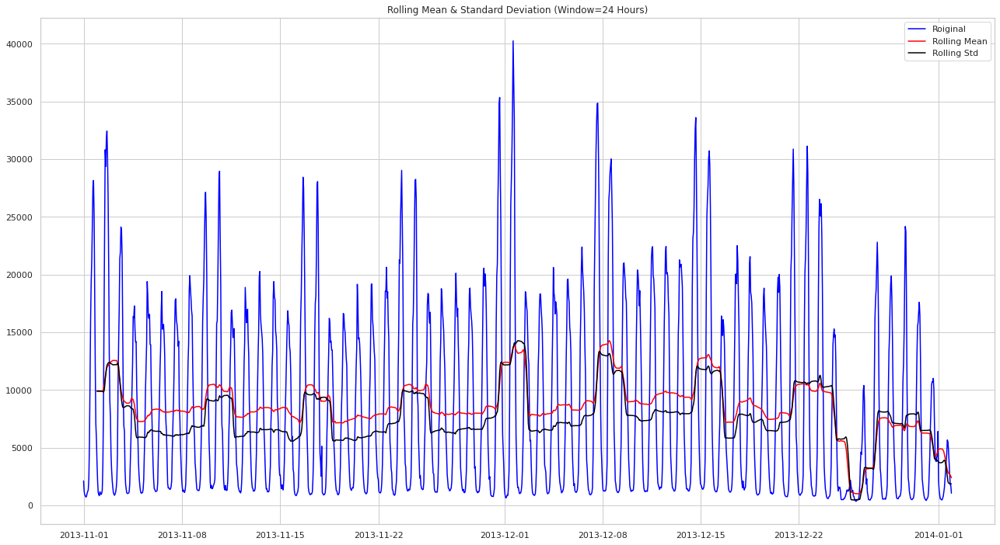

Results of Dickey-Fuller Test:
Test Statistic                   -3.900012
p-value                           0.002035
#Lags Used                       24.000000
Number of Observations Used    1463.000000
Critical Value 1%                -3.434828
Critical Value 5%                -2.863518
Critical Value 10%               -2.567823
dtype: float64


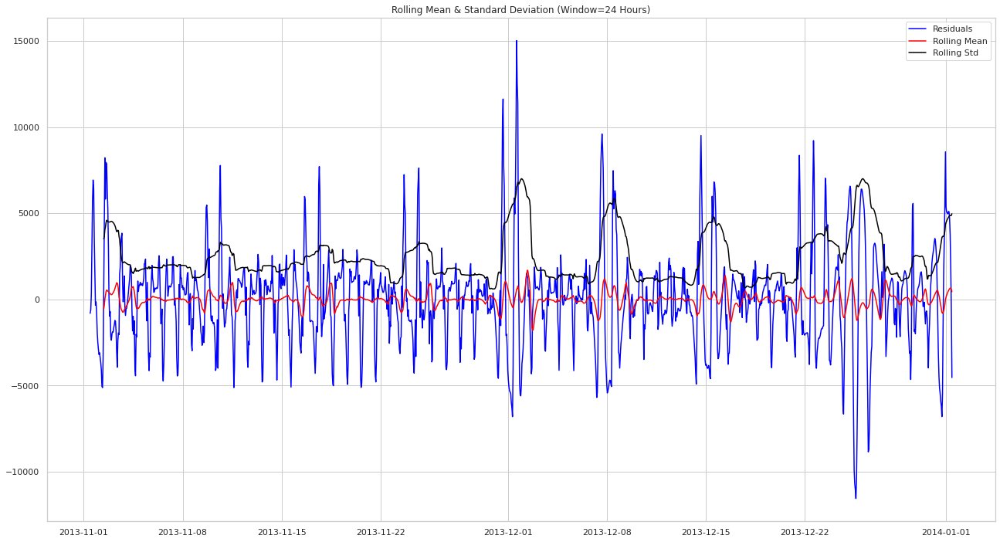

Results of Dickey-Fuller Test:
Test Statistic                -1.526702e+01
p-value                        4.773936e-28
#Lags Used                     2.400000e+01
Number of Observations Used    1.439000e+03
Critical Value 1%             -3.434902e+00
Critical Value 5%             -2.863551e+00
Critical Value 10%            -2.567840e+00
dtype: float64


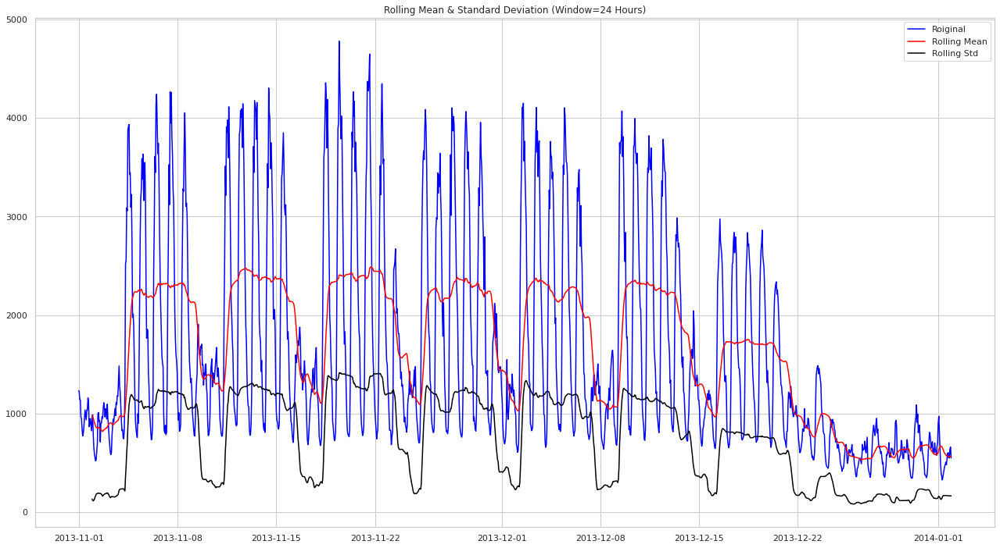

Results of Dickey-Fuller Test:
Test Statistic                   -3.670918
p-value                           0.004541
#Lags Used                       24.000000
Number of Observations Used    1463.000000
Critical Value 1%                -3.434828
Critical Value 5%                -2.863518
Critical Value 10%               -2.567823
dtype: float64


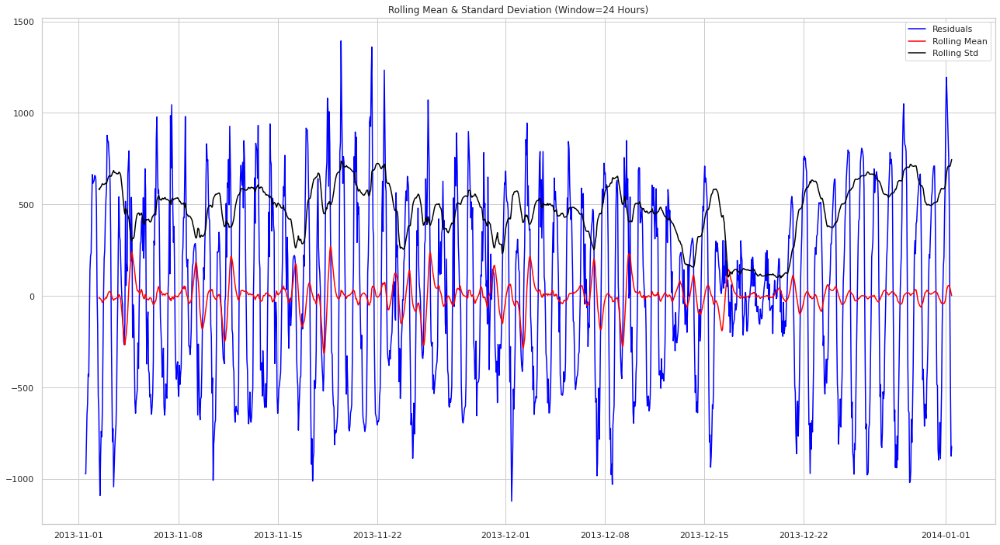

Results of Dickey-Fuller Test:
Test Statistic                -1.494633e+01
p-value                        1.299944e-27
#Lags Used                     2.400000e+01
Number of Observations Used    1.439000e+03
Critical Value 1%             -3.434902e+00
Critical Value 5%             -2.863551e+00
Critical Value 10%            -2.567840e+00
dtype: float64


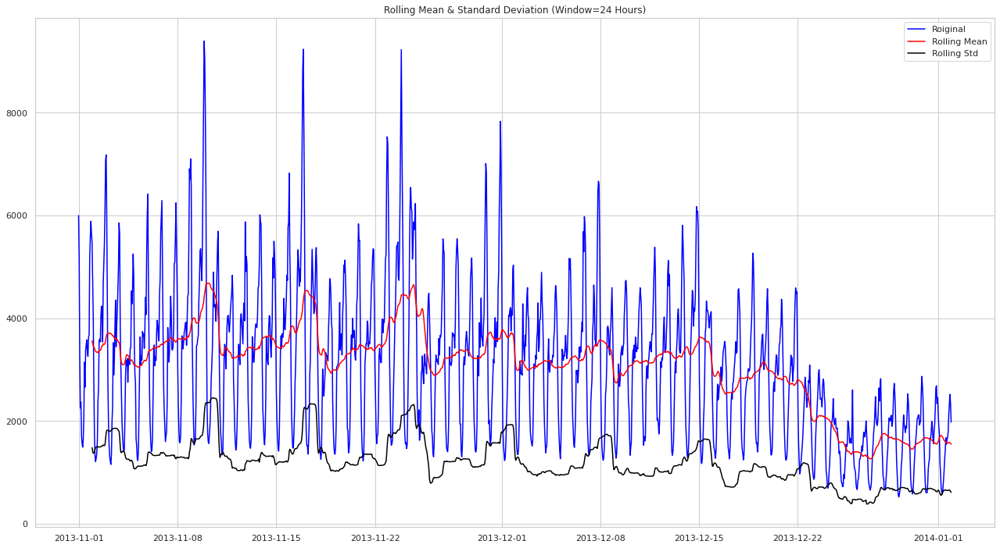

Results of Dickey-Fuller Test:
Test Statistic                   -1.775915
p-value                           0.392483
#Lags Used                       24.000000
Number of Observations Used    1463.000000
Critical Value 1%                -3.434828
Critical Value 5%                -2.863518
Critical Value 10%               -2.567823
dtype: float64


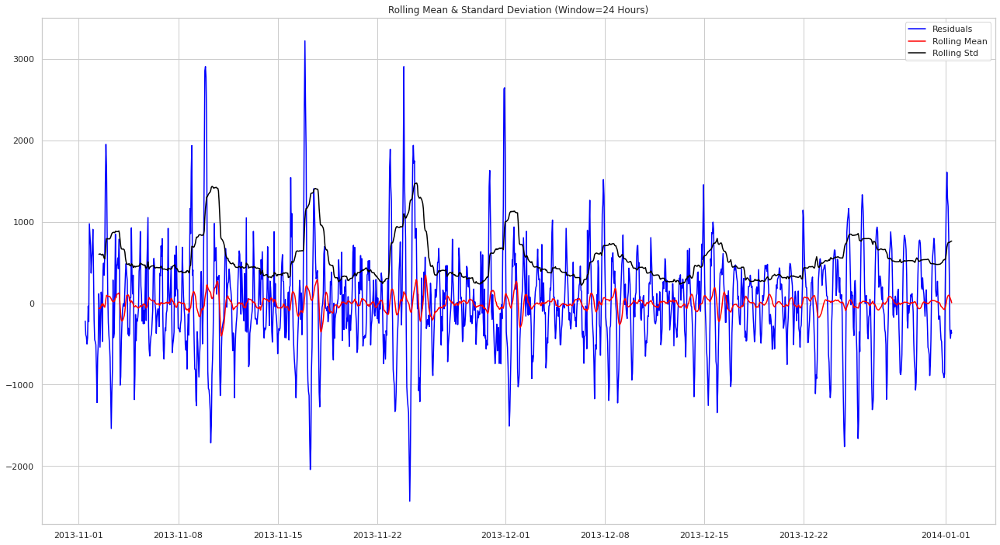

Results of Dickey-Fuller Test:
Test Statistic                -1.349556e+01
p-value                        3.046844e-25
#Lags Used                     2.400000e+01
Number of Observations Used    1.439000e+03
Critical Value 1%             -3.434902e+00
Critical Value 5%             -2.863551e+00
Critical Value 10%            -2.567840e+00
dtype: float64


In [71]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
def test_stationarity(timeseries, square_id:int, label='Roiginal', window=24):  # Default window for 1 month of hourly data (720 hours)
    """
    Test the stationarity of the time series.
    :param timeseries: The time series to analyze (as a Pandas Series).
    :param window: The rolling window size to compute moving averages and standard deviations (default 720 for 1 month of hourly data).
    """
    
    # Determining rolling statistics with a window of 'window' (default 720 for 1 month)
    rolmean = timeseries.rolling(window=window).mean()
    rolstd = timeseries.rolling(window=window).std()

    # Plot rolling statistics
    plt.figure(figsize=(22, 12))
    plt.plot(timeseries, color='blue', label=label)
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title(f'Rolling Mean & Standard Deviation (Window={window} Hours)')
    plt.savefig(f"./figures/test_stationary_{square_id}")
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    if isinstance(timeseries, pd.DataFrame):
        dftest = adfuller(timeseries['internet_traffic_activity'].dropna(), autolag='AIC')
    else:
        dftest = adfuller(timeseries.dropna(), autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput[f'Critical Value {key}'] = value
    print(dfoutput)

    
time_series_5161 = data[data["square_id"]==5161].set_index("start_time")[["internet_traffic_activity"]]
time_series_4159 = data[data["square_id"]==4159].set_index("start_time")[["internet_traffic_activity"]]
time_series_4556 = data[data["square_id"]==4556].set_index("start_time")[["internet_traffic_activity"]]

square_ids_data = [time_series_5161, time_series_4159, time_series_4556]
square_ids = [5161, 4159, 4556]

for square_data, id_square in zip(square_ids_data, square_ids):
    timeseries = square_data
    test_stationarity(timeseries, id_square)

    # Decompose the time series
    df_square = timeseries['internet_traffic_activity']
    decomposition = seasonal_decompose(df_square, model='additive', period=24)

    # Get the residuals
    residuals = decomposition.resid

    # Call the test_stationarity function for residuals
    test_stationarity(residuals, square_id, label='Residuals')
# test_stationarity(time_series_5161, 5161, window=24, )

### Interpretation of  Dickey-Fuller Test for area 5161

In the plot above, we see that Rolling Mean and Rolling std  are almost constant over the time, and the p-value: 0.004819 is less 0.05 that means we reject the hypothesis $H_0$ (which is our time serie is non-stationary). Hence our with series is stationnary, we can use ARIMA model because all assumption met for the area with higest internet traffic activity

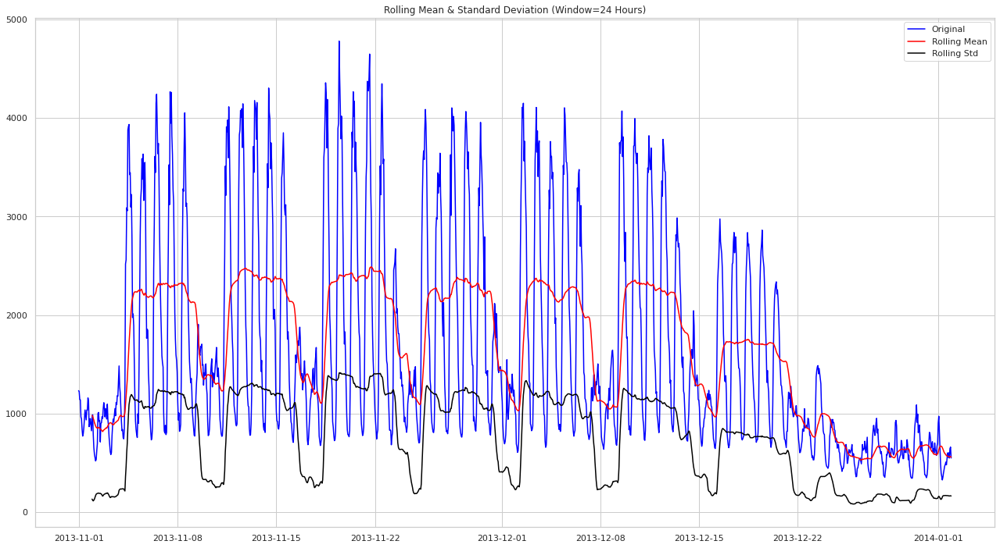

Results of Dickey-Fuller Test:
Test Statistic                   -3.670918
p-value                           0.004541
#Lags Used                       24.000000
Number of Observations Used    1463.000000
Critical Value (1%)              -3.434828
Critical Value (5%)              -2.863518
Critical Value (10%)             -2.567823
dtype: float64


In [60]:
test_stationarity(time_series_4159, 4159, window=24) ## test for 4159 area

### Interpretation of  Dickey-Fuller Test for area 4159

In the plot above, we see that Rolling Mean and Rolling std  are not almost constant over the time, and the p-value: 0.378361 is greater than 0.05 that means we don't reject the hypothesis $H_0$ (which is our time serie is non-stationary). that means the time series for the erea with square: 4159. before using ARIMA model we need to make this time  series stationanry. For this area we need to make our time series stationnary, there are many method to do that like: Estimating & Eliminating Trend, Moving Averagep

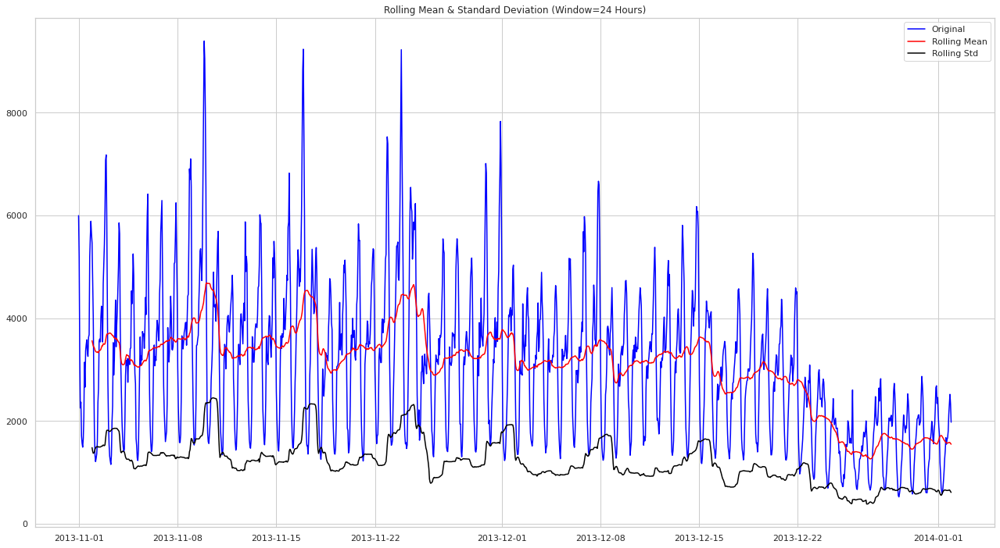

Results of Dickey-Fuller Test:
Test Statistic                   -1.775915
p-value                           0.392483
#Lags Used                       24.000000
Number of Observations Used    1463.000000
Critical Value (1%)              -3.434828
Critical Value (5%)              -2.863518
Critical Value (10%)             -2.567823
dtype: float64


In [62]:
test_stationarity(time_series_4556, 4556, window=24) ## test for area 4556

### Seasonarity and Trend


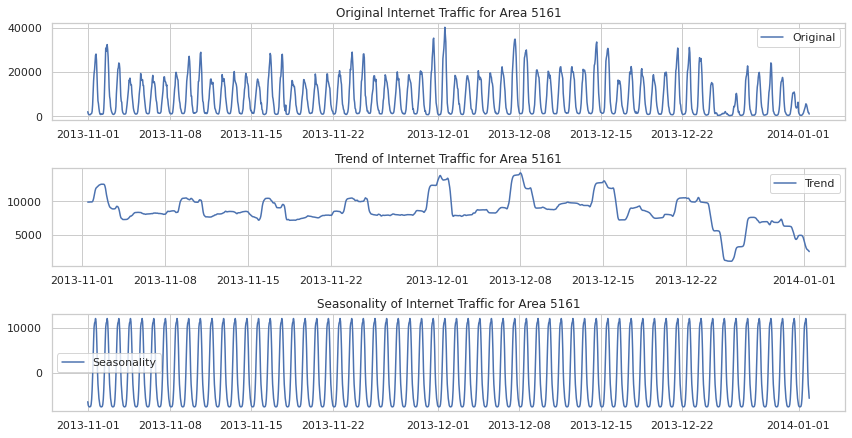

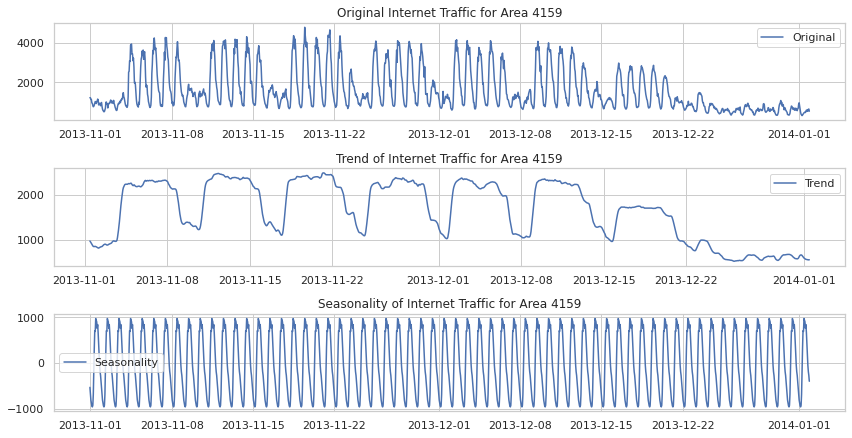

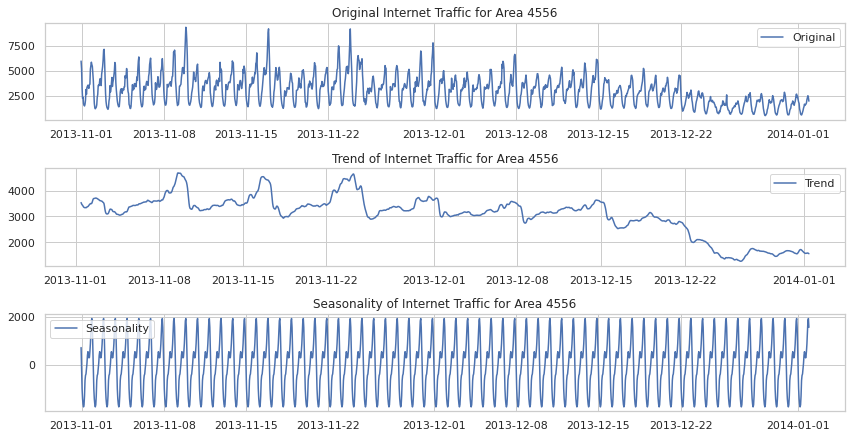

In [82]:


for square_data, id_square in zip(square_ids_data, square_ids):
    timeseries = square_data
    # Decompose the time series
    decomposition = seasonal_decompose(timeseries['internet_traffic_activity'])

    # Plot the original data, the trend, the seasonality, and the residuals 
    plt.figure(figsize=(12,8))
    plt.subplot(411)
    plt.title(f'Original Internet Traffic for Area {id_square}')
    plt.plot(timeseries['internet_traffic_activity'], label='Original')
    plt.legend(loc='best')

    plt.subplot(412)
    plt.plot(decomposition.trend, label='Trend')
    plt.title(f'Trend of Internet Traffic for Area {id_square}')
    plt.legend(loc='best')

    plt.subplot(413)
    plt.title(f'Seasonality of Internet Traffic for Area {id_square}')
    plt.plot(decomposition.seasonal, label='Seasonality')
    plt.legend(loc='best')

    plt.tight_layout()
    plt.savefig(f"./figures/seasonarity_trend_{id_square}.png")
    plt.show()

### Interpretation of  Dickey-Fuller Test for area 4556

In the plot above, we see that Rolling Mean and Rolling std  are almost constant over the time, and the p-value: 0.000012 is less 0.05 that means we reject the hypothesis $H_0$ (which is our time serie is non-stationary). Hence our with series is stationnary, we can use ARIMA model because all assumption met for the area with square_id: 4556

### ACF and  PACF Method

There are many method to find value of p and q, two of them is ACF(Autocorrelation Function) and PACF(Partial Autocorrelation Function). these method help us to find value of p and q graphically:

 - Autocorrelation Function (ACF): It is a measure of the correlation between the the TS with a lagged version of itself. For instance at lag 5, ACF would compare series at time instant ‘t1’…’t2’ with series at instant ‘t1-5’…’t2-5’ (t1-5 and t2 being end points).
 - Partial Autocorrelation Function (PACF): This measures the correlation between the TS with a lagged version of itself but after eliminating the variations already explained by the intervening comparisons. Eg at lag 5, it will check the correlation but remove the effects already explained by lags 1 to 4.

This methode help us to find estimate the range value of p and q. after appply this methode we have a estimation of p and q(range), we can use more sophitical methode like hyperparameter tuning to find the best value of p and q based on statistical metric like AIC etc..

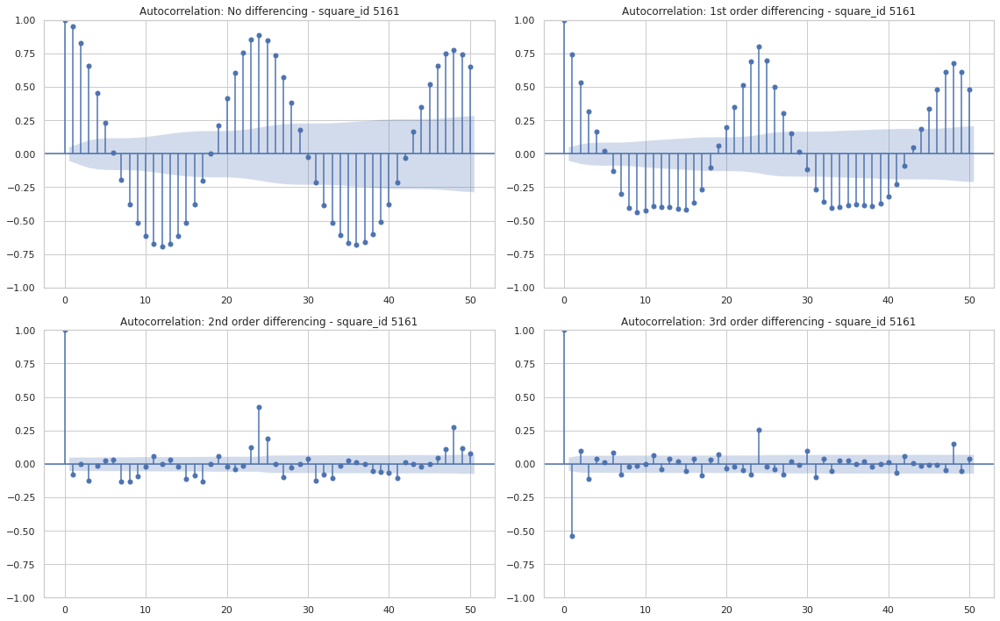

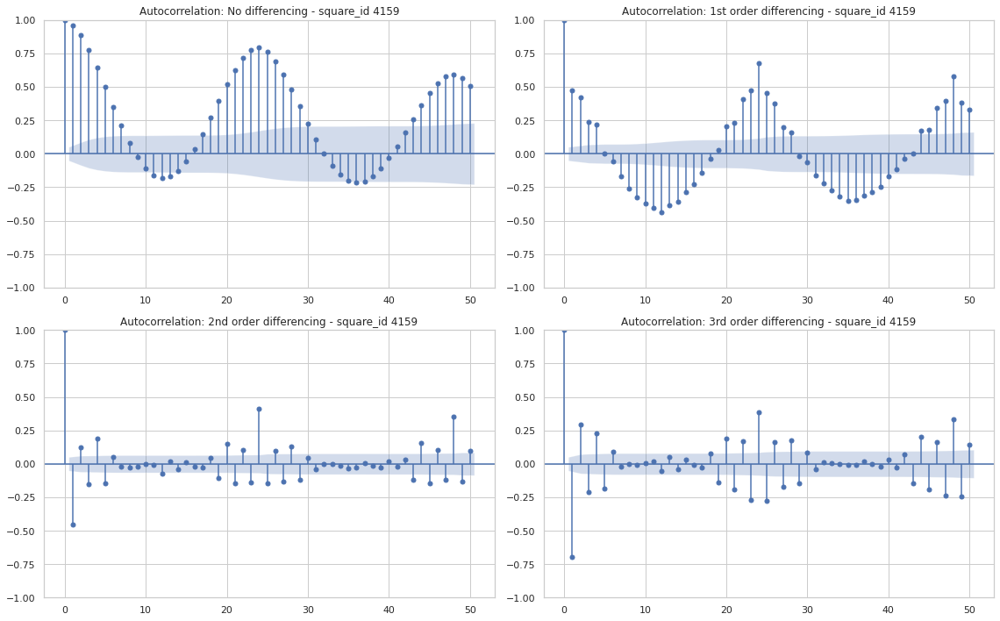

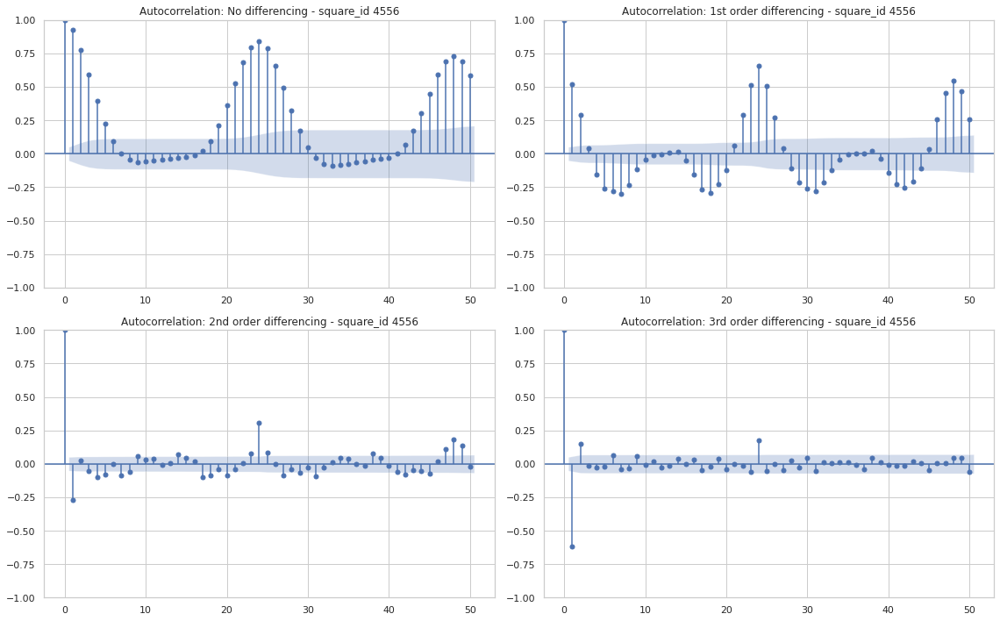

In [63]:
# Perform the test for each square id:
square_ids_data = [time_series_5161, time_series_4159, time_series_4556]
square_ids = [5161, 4159, 4556]

for square_data, id_square in zip(square_ids_data, square_ids):
    timeseries = square_data
    
    # Plot ACF for different orders of differencing
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))

    plot_acf(timeseries, ax=axes[0, 0], lags=50)
    axes[0, 0].set_title(f'Autocorrelation: No differencing - square_id {id_square}')

    plot_acf(timeseries.diff().dropna(), ax=axes[0, 1], lags=50)
    axes[0, 1].set_title(f'Autocorrelation: 1st order differencing - square_id {id_square}')

    plot_acf(timeseries.diff().diff().dropna(), ax=axes[1, 0], lags=50)
    axes[1, 0].set_title(f'Autocorrelation: 2nd order differencing - square_id {id_square}')

    plot_acf(timeseries.diff().diff().diff().dropna(), ax=axes[1, 1], lags=50)
    axes[1, 1].set_title(f'Autocorrelation: 3rd order differencing - square_id {id_square}')

    plt.tight_layout()
    plt.savefig(f"./figures/acf_pacf_method_{id_square}.png")
    plt.show()

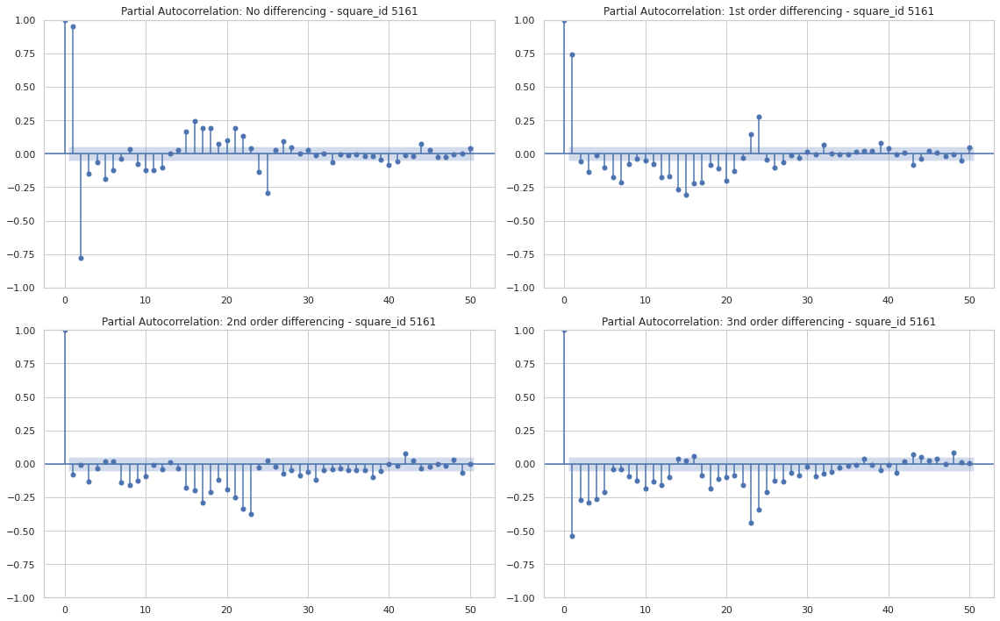

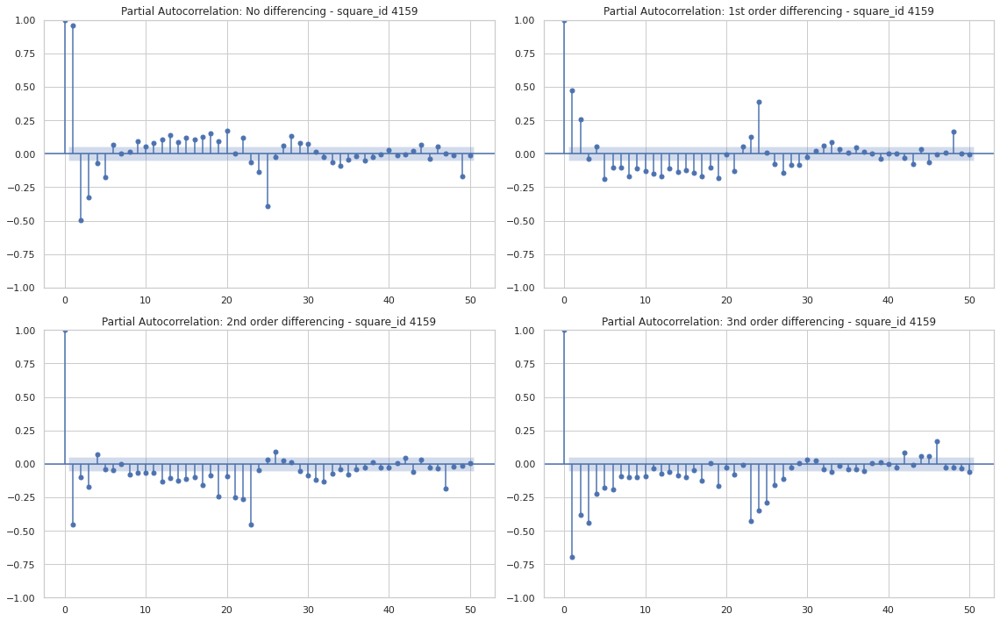

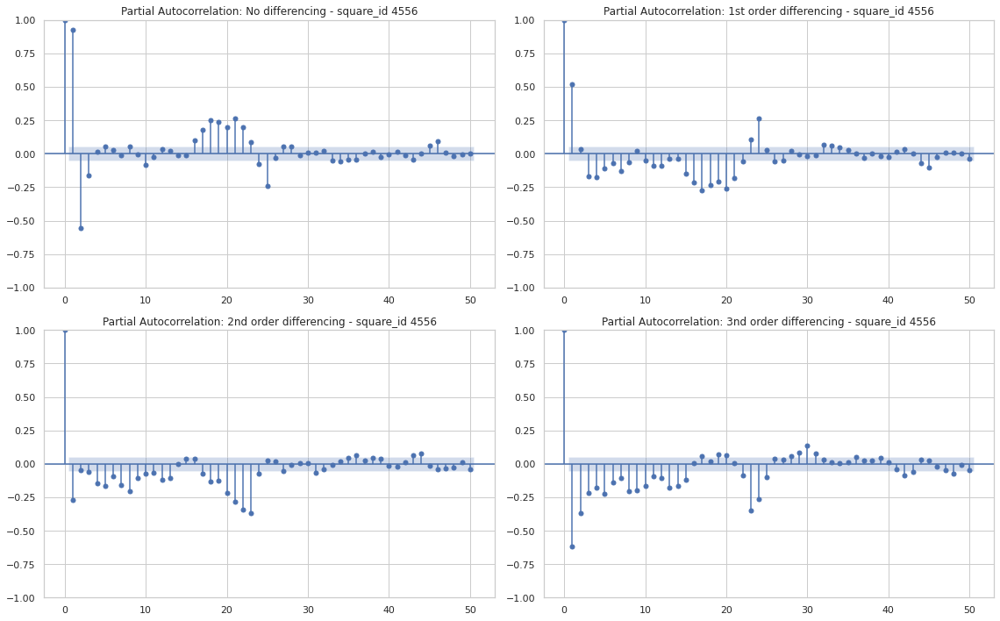

In [19]:
# Perform the test for each square id:
square_ids_data = [time_series_5161, time_series_4159, time_series_4556]
square_ids = [5161, 4159, 4556]

for square_data, id_square in zip(square_ids_data, square_ids):
    timeseries = square_data
    
    # Plot ACF for different orders of differencing
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))

    plot_pacf(timeseries, ax=axes[0, 0], lags=50)
    axes[0, 0].set_title(f'Partial Autocorrelation: No differencing - square_id {id_square}')

    plot_pacf(timeseries.diff().dropna(), ax=axes[0, 1], lags=50)
    axes[0, 1].set_title(f'Partial Autocorrelation: 1st order differencing - square_id {id_square}')

    plot_pacf(timeseries.diff().diff().dropna(), ax=axes[1, 0], lags=50)
    axes[1, 0].set_title(f'Partial Autocorrelation: 2nd order differencing - square_id {id_square}')

    plot_pacf(timeseries.diff().diff().diff().dropna(), ax=axes[1, 1], lags=50)
    axes[1, 1].set_title(f'Partial Autocorrelation: 3nd order differencing - square_id {id_square}')


    plt.tight_layout()
    plt.show()

### HypermaterTuring with auto arima to find the best model for each area of interest

    once we found graphically by method ACF, PACF, now let's find with hypermeter turing the best model for each area

In [80]:
import pmdarima as pm

square_ids_data = [time_series_5161, time_series_4159, time_series_4556]
square_ids = [5161, 4159, 4556]
end_time_train = '2013-12-15'

models_data = pd.DataFrame(columns=['square_id', 'order', 'seasonal_order'])

for square_data, square_id in zip(square_ids_data, square_ids):
    
    train = timeseries[:end_time_train]
    model = pm.auto_arima(train['internet_traffic_activity'], 
                        start_p=1,   max_p=5,    start_q=1,  max_q=5,    m=24,   d=None,
                        start_P=1,   start_Q=1,  D=0,
                        trace=True,
                          seasonal=True,
                        error_action='ignore',  
                        suppress_warnings=True, 
                        stepwise=True,
                        width_intercept=False
                     )
    
    models_data = pd.concat([models_data, pd.DataFrame({
      'square_id': [square_id],
      'order': [model.order],
      'seasonal_order': [model.seasonal_order]
   })], ignore_index=True)
    
    
print(models_data)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(1,0,1)[24] intercept   : AIC=16209.368, Time=6.51 sec
 ARIMA(0,0,0)(0,0,0)[24] intercept   : AIC=18773.841, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[24] intercept   : AIC=16279.522, Time=12.80 sec
 ARIMA(0,0,1)(0,0,1)[24] intercept   : AIC=17205.759, Time=11.89 sec
 ARIMA(0,0,0)(0,0,0)[24]             : AIC=20855.144, Time=0.97 sec
 ARIMA(1,0,1)(0,0,1)[24] intercept   : AIC=16419.948, Time=17.05 sec
 ARIMA(1,0,1)(1,0,0)[24] intercept   : AIC=16250.881, Time=22.88 sec
 ARIMA(1,0,1)(2,0,1)[24] intercept   : AIC=16228.246, Time=44.50 sec
 ARIMA(1,0,1)(1,0,2)[24] intercept   : AIC=16238.363, Time=48.71 sec
 ARIMA(1,0,1)(0,0,0)[24] intercept   : AIC=16663.378, Time=0.34 sec
 ARIMA(1,0,1)(0,0,2)[24] intercept   : AIC=16354.495, Time=21.83 sec
 ARIMA(1,0,1)(2,0,0)[24] intercept   : AIC=16225.994, Time=46.76 sec
 ARIMA(1,0,1)(2,0,2)[24] intercept   : AIC=inf, Time=53.92 sec
 ARIMA(0,0,1)(1,0,1)[24] intercept   : AIC=17182.675, Time=23.61 sec
 

                                      SARIMAX Results                                       
Dep. Variable:            internet_traffic_activity   No. Observations:                 1081
Model:             SARIMAX(1, 0, 0)x(1, 0, [1], 24)   Log Likelihood               -9397.025
Date:                              Sat, 30 Nov 2024   AIC                          18802.050
Time:                                      22:16:12   BIC                          18821.992
Sample:                                  10-31-2013   HQIC                         18809.600
                                       - 12-15-2013                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9995      0.000   2220.665      0.000       0.999       1.000
ar.S.L24       0.99

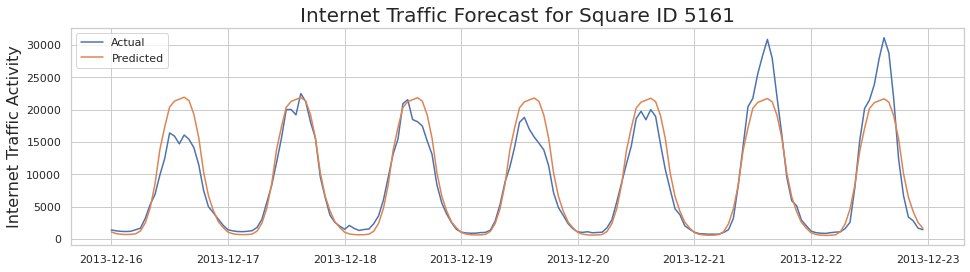

AIC for sarima (Square ID 5161): 18802.049568567316
MAE for sarima (Square ID 5161): 1683.7131649751661
MAPE for sarima (Square ID 5161): 0.23923806809059073%
                                      SARIMAX Results                                       
Dep. Variable:            internet_traffic_activity   No. Observations:                 1081
Model:             SARIMAX(1, 0, 0)x(1, 0, [1], 24)   Log Likelihood               -7404.993
Date:                              Sat, 30 Nov 2024   AIC                          14817.986
Time:                                      22:16:16   BIC                          14837.929
Sample:                                  10-31-2013   HQIC                         14825.537
                                       - 12-15-2013                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------

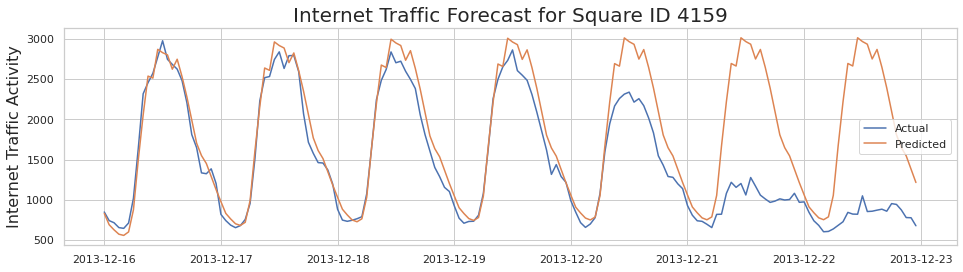

AIC for sarima (Square ID 4159): 14817.98615582478
MAE for sarima (Square ID 4159): 397.370893441464
MAPE for sarima (Square ID 4159): 0.37304417433436626%
                                      SARIMAX Results                                       
Dep. Variable:            internet_traffic_activity   No. Observations:                 1081
Model:             SARIMAX(1, 0, 0)x(1, 0, [1], 24)   Log Likelihood               -8112.486
Date:                              Sat, 30 Nov 2024   AIC                          16232.972
Time:                                      22:16:21   BIC                          16252.914
Sample:                                  10-31-2013   HQIC                         16240.523
                                       - 12-15-2013                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------

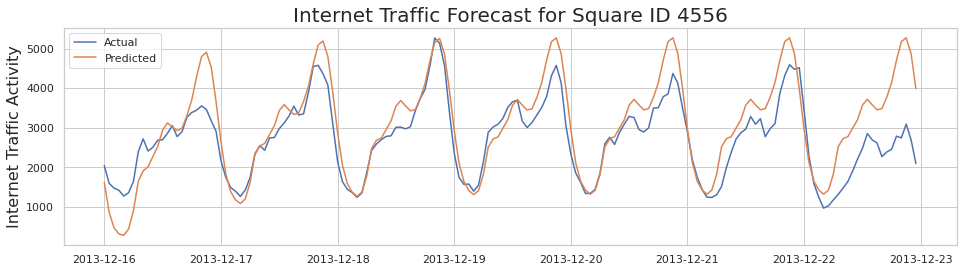

AIC for sarima (Square ID 4556): 16232.97169068984
MAE for sarima (Square ID 4556): 502.3057079524565
MAPE for sarima (Square ID 4556): 0.20404037225955823%


In [81]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error

square_ids_data = [time_series_5161, time_series_4159, time_series_4556]
square_ids = [5161, 4159, 4556]
test_start_data, test_end_data =  '2013-12-16', '2013-12-22'

for square_data, square_id in zip(square_ids_data, square_ids):
    
    train = square_data[:end_time_train]
    train = train.asfreq('h') 
    test = square_data[test_start_data:test_end_data]
    
    # Define the SARIMAX model
    sarima = SARIMAX(
                train['internet_traffic_activity'], 
                order=(1,0,0),
                seasonal_order=(1, 0, 1, 24)
                )

    # Fit the model
    model_fit = sarima.fit(disp=False, maxiter=300)
    
    
    # Make predictions for the test set period
    predictions = model_fit.predict(start='2013-12-16 00:00:00', end='2013-12-22 23:00:00')
    print(model_fit.summary(alpha=0.05)) 

    # Plot actual vs predicted values
    plt.figure(figsize=(16,4))
    plt.plot(test.loc['2013-12-16 00:00:00':'2013-12-22 23:00:00'], label="Actual")
    plt.plot(predictions, label="Predicted")
    plt.title(f'Internet Traffic Forecast for Square ID {square_id}', fontsize=20)
    plt.ylabel('Internet Traffic Activity', fontsize=16)
    plt.legend()
    plt.savefig(f"./figures/predicted_{square_id}")
    plt.show()

    # Calculate and print AIC & MAE & MAPE for both models
    print(f"AIC for sarima (Square ID {square_id}): {model_fit.aic}")
    print(f"MAE for sarima (Square ID {square_id}): {mean_absolute_error(test['internet_traffic_activity'], predictions)}")
    print(f"MAPE for sarima (Square ID {square_id}): {mean_absolute_percentage_error(test['internet_traffic_activity'], predictions)}%")